In [7]:
import numpy as np
import scipy as sp
import struct
import glob
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import time
# from numba import int64, int32, float32, boolean, jitclass, char, njit, jit
import numba
import sys
from astropy.table import Table
from astropy.table import Column
from astropy.io import ascii
import xarray as xr
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from ScatterPy import *

def f_Hilbert(a_short,b_short):
    a_long = (np.expand_dims(np.ones(len(b_short)),axis=1)*np.expand_dims(a_short,axis=0)).flatten()
    b_long = (np.expand_dims(np.ones(len(a_short)),axis=0)*np.expand_dims(b_short,axis=1)).flatten()
    return a_long,b_long

%matplotlib widget

# Given a set of lattice parameters, a defined scattering plane, and incident energy, this notebook provides tth and th angles and corresponding Q-values 
The u, v, lat_pars, and Ei parameters always need to be defined. N, tth, th, and coinc arguements are optional.
The main function is f_C, which outputs an "xarray.DataSet" called "C" and a corresponding "pandas.DataFrame" called "Cdf". C is the object useful for further calculations or getting more detailed information, while Cdf is to provide and summary as a table.

The f_C function can be used in three ways:
1. leave kwd_args (tth,th,coinc) default: tth and th are chosen equal to the available ranges for SIX
2. input user defined tth and th values. These need to be "long" meaning they need to repeat values to fill up the corresponding 2D tth/th phase-space. The coinc and hkl kwd_args are not used.
3. if coinc = True, there needs to be user defined tth and th, and they should be "short" meaning they should only have unique values. The result: for each user defined tth value, th values are calculated to provide constant cuts along the chosen hkl axis
4. Choose __Q__ positions to visit and calculate the corresponding th, tth positions

## Set scattering plane, lattice parameters, and incident energy

In [32]:
u = np.array([-1,0,0]); # u is the vector intended to be parallel to the surface of the sample holder. I.e. -u points from the sample to the detector when tth=90 and th=90.
v = np.array([0,-1,0]); # v is the vector intended to be normal to the surface of the sample holder. I.e. v is the direction of the incoming x-ray beam on the sample when th=90.
lat_pars = {'lengths':[8.239,8.239,8.239],'angles':[90, 90, 90]}   # LiV2O4 values
Ei = 512

## Method 1 example. Use this by default, no new parameters need be defined

In [35]:
C,Cdf = f_C(lat_pars,u,v,Ei)
printeverythingdf(Cdf) #
# Cdf.to_csv('Cdf.csv') # uncomment this if you want to save to a spreedsheet file

[0.76261504 0.76261504 0.76261504]
{'lengths': [8.239, 8.239, 8.239], 'angles': [90, 90, 90]}
         tth     th    |Q|     Qx     Qy   Qz      H      K    L
index                                                           
0       90.0    0.0  0.367 -0.259  0.259  0.0 -0.340  0.340  0.0
1       90.0   10.0  0.367 -0.210  0.301  0.0 -0.276  0.394  0.0
2       90.0   20.0  0.367 -0.155  0.333  0.0 -0.203  0.436  0.0
3       90.0   30.0  0.367 -0.095  0.354  0.0 -0.125  0.465  0.0
4       90.0   40.0  0.367 -0.032  0.366  0.0 -0.042  0.479  0.0
5       90.0   50.0  0.367  0.032  0.366  0.0  0.042  0.479  0.0
6       90.0   60.0  0.367  0.095  0.354  0.0  0.125  0.465  0.0
7       90.0   70.0  0.367  0.155  0.333  0.0  0.203  0.436  0.0
8       90.0   80.0  0.367  0.210  0.301  0.0  0.276  0.394  0.0
9      100.0    0.0  0.398 -0.305  0.256  0.0 -0.399  0.335  0.0
10     100.0   10.0  0.398 -0.256  0.305  0.0 -0.335  0.399  0.0
11     100.0   20.0  0.398 -0.199  0.344  0.0 -0.261  0.451  

__Plot HKL points__:

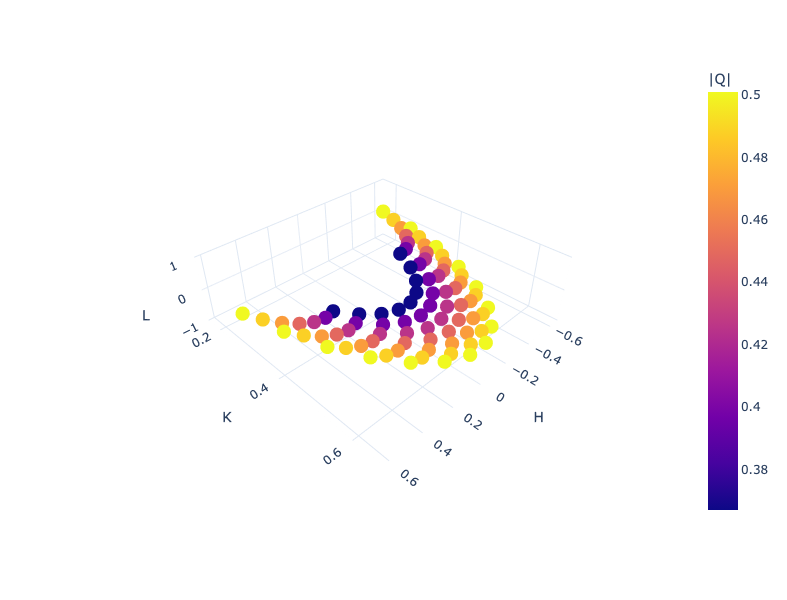

In [37]:
import plotly.express as px

fig = px.scatter_3d(Cdf, x='H', y='K', z='L',color='|Q|')
fig.update_traces(marker_size=8)
fig.update_layout(autosize=False, width=800, height=600, template = 'plotly_white')
fig.update_scenes(aspectratio = {'x':1,'y':1,'z':.3})
fig.show()

## Method 2: chose th/tth values.

In [8]:
%%time
u_array = np.array([[-1,0,0], [-1,0,0], [-1,-1,0]])
v_array = np.array([[0,-1,0], [0,0,-1], [0,0,-1]])

th_short = np.arange(5,145,1)
tth_short = np.arange(10,150,1)

th_long,tth_long = f_Hilbert(th_short,tth_short)
C,Cdf = [],[]
for i, (u,v) in enumerate(zip(u_array,v_array)):
    c,cdf = f_C(lat_pars,u,v,Ei,tth=tth_long,th=th_long)
    start = len(cdf.index)*i
    c['index'] = c['index']+start
    cdf.index = cdf.index + start
    C.append(c)
    Cdf.append(cdf)
C = xr.concat(C,dim='index',data_vars='all')
Cdf = pd.concat(Cdf)
# printeverythingdf(Cdf)

[1.20068513 1.13067938 0.83001127]
{'lengths': [5.233, 5.557, 7.57], 'angles': [90, 90, 90]}
[1.20068513 1.13067938 0.83001127]
{'lengths': [5.233, 5.557, 7.57], 'angles': [90, 90, 90]}
[1.20068513 1.13067938 0.83001127]
{'lengths': [5.233, 5.557, 7.57], 'angles': [90, 90, 90]}
CPU times: user 113 ms, sys: 21.2 ms, total: 134 ms
Wall time: 143 ms


In [63]:
fig = px.scatter_3d(Cdf, x='H', y='K', z='L',color='|Q|')
fig.update_traces(marker_size=1)
fig.update_layout(autosize=False, width=800, height=600, template = 'plotly_white')
fig.update_scenes(aspectratio = {'x':1,'y':1,'z':1})

# Cube edges (width=2, centered at origin)
r = 1
corners = np.array([[x, y, z] for x in [-r, r] for y in [-r, r] for z in [-r, r]])

edges_x, edges_y, edges_z = [], [], []
for i, c1 in enumerate(corners):
    for c2 in corners[i+1:]:
        if np.sum(c1 != c2) == 1:
            edges_x += [c1[0], c2[0], None]
            edges_y += [c1[1], c2[1], None]
            edges_z += [c1[2], c2[2], None]

fig.add_trace(go.Scatter3d(
    x=edges_x, y=edges_y, z=edges_z,
    mode='lines',
    line=dict(color='black', width=2),
    showlegend=False
))

# --- User-defined length ---
vector_length = 1.  # <-- change this

factors = {
    '(0,0,1)': ([0, 0, 1], 1.5),
    '(0,1,0)': ([0, 1, 0], 1),
    '(1,0,0)': ([1, 0, 0], 1),
    '(1,1,0)': ([1, 1, 0], np.sqrt(2)),  # extra sqrt(2) factor
    '(1,0,1)': ([1, 0, 1], np.sqrt(2)),  # extra sqrt(2) factor
    '(1,1,1)': ([1, 1, 1], np.sqrt(3)),  # extra sqrt(2) factor
}

# Compute all tip positions first
tips = {}
for label, (vec, scale) in factors.items():
    v = np.array(vec, dtype=float)
    v = v / np.linalg.norm(v) * vector_length * scale
    tips[label] = v

# Compute axis ranges to include all tips + cube + some padding
all_points = np.array(list(tips.values()) + [[-r,-r,-r], [r,r,r]])
pad = 1
x_range = [all_points[:,0].min() - pad, all_points[:,0].max() + pad]
y_range = [all_points[:,1].min() - pad, all_points[:,1].max() + pad]
z_range = [all_points[:,2].min() - pad, all_points[:,2].max() + pad]

for label, v in tips.items():
    raw = np.array(factors[label][0], dtype=float)

    # Tiny epsilon nudge so Plotly can orient the cone unambiguously
    direction = raw.copy()
    if np.allclose(direction[:2], 0):  # pure-Z vector: nudge x slightly
        direction[0] += 1e-9

    if (label == '(1,1,0)')|(label == '(1,0,1)')|(label == '(1,1,1)'):
        fig.add_trace(go.Cone(
            x=[v[0]*1.], y=[v[1]*1.], z=[v[2]*1.],
            u=[direction[0]], v=[direction[1]], w=[direction[2]],
            sizemode='absolute',
            sizeref=0.15,
            colorscale=[[0, 'red'], [1, 'red']],
            showscale=False,
            showlegend=False,
            anchor='tip',
        ))
    elif label == '(0,0,1)':
        fig.add_trace(go.Cone(
            x=[v[0]*1.3], y=[v[1]*1.3], z=[v[2]*1.3],
            u=[direction[0]], v=[direction[1]], w=[direction[2]],
            sizemode='absolute',
            sizeref=0.6,
            colorscale=[[0, 'red'], [1, 'red']],
            showscale=False,
            showlegend=False,
            anchor='tip',
        ))
    else:
            fig.add_trace(go.Cone(
            x=[v[0]*(1.15)], y=[v[1]*1.15], z=[v[2]*1.15],
            u=[direction[0]], v=[direction[1]], w=[direction[2]],
            sizemode='absolute',
            sizeref=0.15,
            colorscale=[[0, 'red'], [1, 'red']],
            showscale=False,
            showlegend=False,
            anchor='tip',
        ))

    fig.add_trace(go.Scatter3d(
        x=[0, v[0]], y=[0, v[1]], z=[0, v[2]],
        mode='lines+text',
        line=dict(color='red', width=4),
        text=['', label],
        textposition='top center',
        textfont=dict(color='red', size=12),
        showlegend=False
    ))

fig.update_scenes(
    aspectratio={'x': 1, 'y': 1, 'z': .3},
    xaxis=dict(range=x_range),
    yaxis=dict(range=y_range),
    zaxis=dict(range=z_range),
)

fig.update_scenes(
    xaxis=dict(visible=False),
    yaxis=dict(visible=False),
    zaxis=dict(visible=False),
)

fig.update_layout(
    paper_bgcolor='rgba(0,0,0,0)',
    scene=dict(bgcolor='rgba(0,0,0,0)'),
)

fig.update_layout(
    scene_camera=dict(
        eye=dict(x=.5, y=.7, z=.2),  # <-- change these to reorient
    )
)

fig.show()
fig.write_image('BZ.png',format = 'png')

In [14]:
fig.write_image('BZ.png',format = 'png')

NameError: name 'fig' is not defined

## Method 3: use to make constant h/k/l cuts

In [25]:
th_short = np.arange(0,90,10)
tth_short = np.arange(90,150,10)
C,Cdf = C,Cdf = f_C(lat_pars,u,v,Ei,tth=tth_short,th=th_short,coinc=True,hkl='l')
printeverythingdf(Cdf)

[1.20068513 1.13067938 0.83001127]
{'lengths': [5.233, 5.557, 7.57], 'angles': [90, 90, 90]}
       tth      th    |Q|     Qx   Qy     Qz      H    K      L
index                                                          
0       90 -40.000  5.734 -5.712  0.0  0.500 -4.757  0.0  0.602
1       90 -40.000  5.734 -5.712  0.0  0.500 -4.757  0.0  0.602
2       90 -30.000  5.734 -5.538  0.0  1.484 -4.613  0.0  1.788
3       90 -30.000  5.734 -5.538  0.0  1.484 -4.613  0.0  1.788
4       90 -20.000  5.734 -5.196  0.0  2.423 -4.328  0.0  2.919
5       90 -20.000  5.734 -5.196  0.0  2.423 -4.328  0.0  2.919
6       90 -10.000  5.734 -4.697  0.0  3.289 -3.912  0.0  3.962
7       90 -10.000  5.734 -4.697  0.0  3.289 -3.912  0.0  3.962
8       90   0.000  5.734 -4.054  0.0  4.054 -3.377  0.0  4.885
9      100 -16.860  6.211 -5.712  0.0  2.441 -4.757  0.0  2.941
10     100 -16.860  6.211 -5.712  0.0  2.441 -4.757  0.0  2.941
11     100 -13.076  6.211 -5.538  0.0  2.813 -4.613  0.0  3.389
12     100 

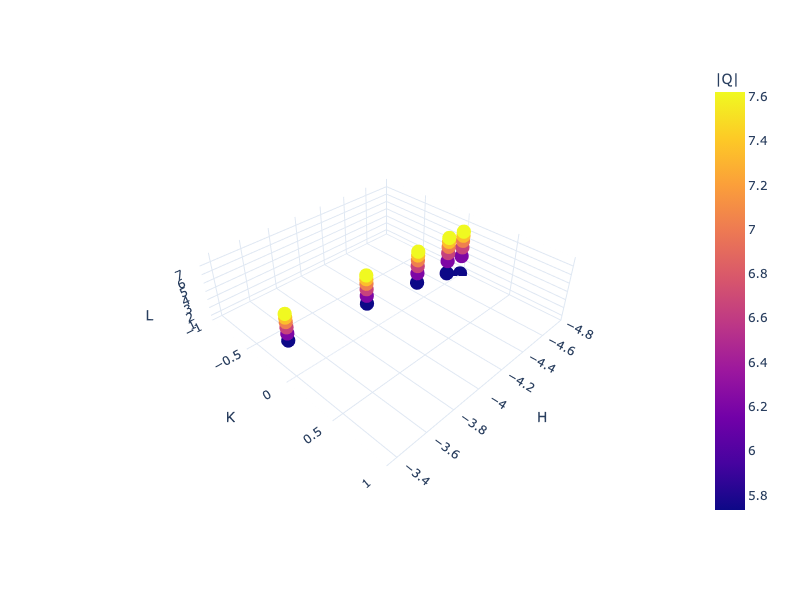

In [27]:
fig = px.scatter_3d(Cdf, x='H', y='K', z='L',color='|Q|')
fig.update_traces(marker_size=8)
fig.update_layout(autosize=False, width=800, height=600, template = 'plotly_white')
fig.update_scenes(aspectratio = {'x':1,'y':1,'z':.3})
fig.show()

## Method 4: input Q and return th, tth values

In [68]:
h = np.arange(-.2,.21,.04); lh=len(h)
k = np.arange(.6,.71,.02); lk=len(k)
h = np.repeat(h,lk).round(2)
k = np.repeat([k],lh,axis=0).flatten()
l = np.zeros(lh*lk)
Q_rlu = np.transpose(np.array([h,k,l]))
u = np.array([-1,0,0])
v = np.array([0,0,-1])
Q_rlu = np.array([[0,0,2],[-2,0,4],[-3,0,1],[1,0,3]])
Ei = 8015

lat_pars = {'lengths': [5.233, 5.557, 7.57], 'angles': [90, 90, 90]}
C,Cdf = f_C(lat_pars,u,v,Ei,Q_rlu=Q_rlu)
printeverythingdf(Cdf) #

lat_pars = {'lengths': [5.557, 5.233, 7.57], 'angles': [90, 90, 90]}
C,Cdf = f_C(lat_pars,u,v,Ei,Q_rlu=Q_rlu)
printeverythingdf(Cdf) #


[1.20068513 1.13067938 0.83001127]
{'lengths': [5.233, 5.557, 7.57], 'angles': [90, 90, 90]}
Max |Q| = 8.12 (inv ang) = 6.77[H,0,0] (r.l.u.)
          tth       th    |Q|     Qx   Qy    Qz    H    K    L
index                                                         
0      23.582   11.791  1.660  0.000  0.0  1.66  0.0  0.0  2.0
1      60.582   66.169  4.097  2.401  0.0  3.32  2.0  0.0  4.0
2      54.133  104.090  3.696  3.602 -0.0  0.83  3.0 -0.0  1.0
3      39.789   -5.849  2.764 -1.201  0.0  2.49 -1.0  0.0  3.0
[1.13067938 1.20068513 0.83001127]
{'lengths': [5.557, 5.233, 7.57], 'angles': [90, 90, 90]}
Max |Q| = 8.12 (inv ang) = 7.18[H,0,0] (r.l.u.)
          tth       th    |Q|     Qx   Qy    Qz    H    K    L
index                                                         
0      23.582   11.791  1.660  0.000  0.0  1.66  0.0  0.0  2.0
1      59.272   63.895  4.017  2.261  0.0  3.32  2.0  0.0  4.0
2      50.919  101.710  3.492  3.392 -0.0  0.83  3.0 -0.0  1.0
3      39.344   -4.750  2

In [50]:
lat_pars = {'lengths': [5.233, 5.557, 7.57], 'angles': [90, 90, 90]}

{'lengths': [5.233, 5.557, 7.57], 'angles': [90, 90, 90]}

In [12]:
fig = px.scatter_3d(Cdf, x='H', y='K', z='L',color='|Q|')
fig.update_traces(marker_size=8)
fig.update_layout(autosize=False, width=800, height=600, template = 'plotly_white')
fig.update_scenes(aspectratio = {'x':1,'y':1,'z':.3})
fig.show()